In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
cos_sim_df = pd.read_parquet(
    "../07.compute-cosine-similarities/cos_sim/cosine_similarities_genes_crispr-all.parquet"
)

cos_sim_df.head()

,non-targeting,PALS2,no-guide,VNN3P,MRE11,SEPTIN5,SEPTIN1,AFG2B,MRPL58,GUCY1B1,...,SFXN1,BZW2,SLC25A22,GUCA1A,SIX6,SMARCA4,TGIF1,LRSAM1,INPP5B,SPTLC1
non-targeting,1.000000,-0.059666,0.554028,-0.044920,0.084458,0.198055,0.163457,0.045020,0.218653,-0.030881,...,0.001680,0.029651,0.004144,-0.038176,0.017746,0.082222,0.133552,0.256799,0.150499,-0.148298
PALS2,-0.059666,1.000000,0.068846,0.257723,-0.055745,0.160068,0.066599,0.226660,-0.096645,0.182161,...,0.033832,0.003136,0.077804,0.180820,0.108754,-0.149984,0.164068,-0.032468,0.032573,-0.004394
no-guide,0.554028,0.068846,1.000000,-0.021055,-0.020687,0.118124,-0.013529,0.061264,0.224400,-0.030042,...,-0.000750,0.091534,0.099934,-0.056077,0.029897,0.240102,0.050657,0.138434,-0.004588,0.064069
VNN3P,-0.044920,0.257723,-0.021055,1.000000,0.089644,0.067335,-0.025578,0.123663,0.071904,-0.054312,...,-0.197055,0.110045,0.065167,0.082572,0.009010,-0.067736,-0.049077,-0.073309,0.013022,0.079246
MRE11,0.084458,-0.055745,-0.020687,0.089644,1.000000,0.071703,-0.216770,-0.076589,-0.111722,-0.066612,...,-0.073299,0.049652,-0.065445,0.165883,0.172696,-0.025268,0.084685,0.012524,0.104712,-0.056433


In [3]:
chromosome_df = pd.read_csv(
    "../00.download-and-process-annotations/output/gene_chromosome_location_processed.tsv",
    sep="\t", usecols=["Approved_symbol", "Chromosome_number", "Arm_name"]
)

chromosome_df.replace({"Chromosome_number": {"X": 23, "Y": 24}}, inplace=True)

chromosome_df["Chromosome_number"] = chromosome_df["Chromosome_number"].astype(int)

chromosome_df = (
    chromosome_df.assign(Chromosome_arm=lambda x: x.apply(lambda y: f'{y.Chromosome_number:02}{y.Arm_name}', axis=1)) # Add leading zero
)

chromosome_df.head()

,Approved_symbol,Chromosome_number,Arm_name,Chromosome_arm
0,A1BG,19,q,19q
1,A1BG-AS1,19,q,19q
2,A1CF,10,q,10q
3,A2M,12,p,12p
4,A2M-AS1,12,p,12p


In [4]:
genes_df = pd.DataFrame(
    {"Approved_symbol": cos_sim_df.columns},
    index=[i for i in range(len(cos_sim_df.columns))],
)

genes_df = genes_df.merge(chromosome_df, how="inner", on="Approved_symbol")

genes_df = genes_df.sort_values(by=["Chromosome_number", "Arm_name"]).reset_index(drop=True)

genes_df.head()

,Approved_symbol,Chromosome_number,Arm_name,Chromosome_arm
0,SARS1,1,p,01p
1,TUT4,1,p,01p
2,YARS1,1,p,01p
3,ADPRS,1,p,01p
4,ELOA,1,p,01p


In [5]:
# Compute borderline index when chromosome number changes
chrom_group = genes_df.groupby('Chromosome_number').groups
chrom_idx = []
for gp in chrom_group:
    chrom_idx.append(chrom_group[gp][0])
chrom_idx.sort()

# Compute borderline index when chromosome arm changes
locus_group = genes_df.groupby('Chromosome_arm').groups
arm_idx = []
for gp in locus_group:
    idx = locus_group[gp][0]
    if idx not in chrom_idx:
        arm_idx.append(idx)
arm_idx.sort()

In [6]:
genes = genes_df.Approved_symbol.to_list()

cos_sim_df = cos_sim_df.loc[genes, genes]

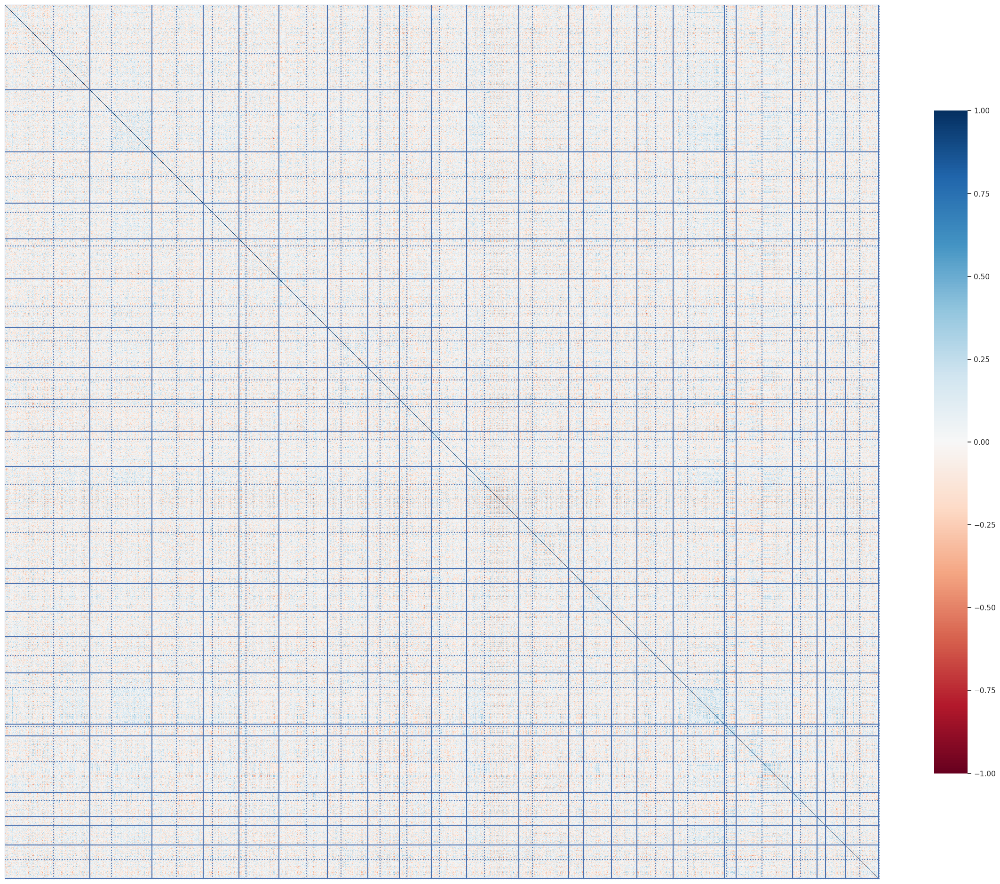

In [7]:
sns.set(rc={"figure.figsize": (30, 30)})

ax = sns.heatmap(
    cos_sim_df,
    cmap="RdBu",
    square=True,
    vmin=-1, 
    vmax=1,
    xticklabels=False,
    yticklabels=False,
    cbar_kws={"shrink": 0.61},
)

ax.hlines(chrom_idx, *ax.get_xlim())
ax.hlines(arm_idx, linestyles='dotted', *ax.get_xlim())
ax.vlines(chrom_idx, *ax.get_ylim())
ax.vlines(arm_idx, linestyles='dotted', *ax.get_ylim())

plt.savefig("figures/crispr-chromosome-arm-similarity.png", dpi=300)
